## Multi-Bar Classification

Description:
Here, we classify whether price will move up, down, or remain neutral over a fixed horizon (e.g., 5 bars). We label each bar with −1,0,+1 based on future returns exceeding positive/negative thresholds. A classifier (e.g., RandomForestClassifier) then learns to predict these discrete classes, which we translate into trading signals.

#### 📌 Important Note:
This notebook contains *interactive charts generated using Vectorbt.  
GitHub does not display interactive Plotly charts, so the graphs will not be visible here.  

✅ To view the charts, please download this notebook and run it on your local machine.  
Make sure you have Vectorbt and its dependencies installed to regenerate the visualizations.


## Part 1: Data & Feature Engineering

**Objective:**  
Load raw price data (MetaTrader 5 or CSV) and transform it into a feature-rich dataset.

**Tasks:**
- Fetch historical bars  
- Apply `ta.add_all_ta_features` or custom features  
- (Optionally) create specific labels (multi-bar, double-barrier, regime, etc.)  
- Clean/prepare the final feature matrix **X** and target **y**  

In [1]:
# ----------------------------------------------------------------------------
# 0) SETUP
# ----------------------------------------------------------------------------
import sys
import os
import warnings
from pathlib import Path

project_root = Path.cwd().parent.parent
sys.path.append(str(project_root))
os.chdir(str(project_root))
warnings.filterwarnings("ignore")




%pip install seaborn

import pandas as pd
import numpy as np
import MetaTrader5 as mt5
import vectorbt as vbt
import seaborn as sns
import matplotlib.pyplot as plt
import joblib

from data.data_loader_mt5 import get_data_mt5
from features.feature_engineering import add_core_features  # <-- Use your new function!
from features.labeling_schemes import create_labels_multi_bar, create_labels_double_barrier
from backtests.simple_backtest import simulate_trading, calculate_sharpe_ratio

from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.naive_bayes import GaussianNB, BernoulliNB
from sklearn.metrics import accuracy_score
from sklearn.model_selection import TimeSeriesSplit


import plotly.graph_objects as go
import plotly.express as px


# ----------------------------------------------------------------------------
# 1) LIST OF SYMBOLS
# ----------------------------------------------------------------------------
symbols = [
    "US500", "US2000", "UK100", "JP225", "XAUUSD", "DE40", "US30",
    "USTEC", "BTCUSD", "AAPL.NAS", "MSFT.NAS", "GOOG.NAS", "AMZN.NAS", "TSLA.NAS",
    "EURUSD", "GBPUSD", "AUDUSD", "USDJPY", "USDCHF", "GBPJPY", "EURGBP", "CHFJPY", "GBPCHF",
    "ETHUSD", "BNBUSD", "LTCUSD", "XRPUSD", "SOLUSD", "ADAUSD", "DOTUSD", "DOGUSD"
]
timeframe = mt5.TIMEFRAME_H1
n_bars = 20000
start_pos = 5000
horizon = 5  # for multi-bar
threshold = 0.005

# Map MT5 timeframe to string format for vectorbt portfolio frequency
freq_mapping = {
    mt5.TIMEFRAME_M1: '1min',
    mt5.TIMEFRAME_M5: '5min',
    mt5.TIMEFRAME_M15: '15min',
    mt5.TIMEFRAME_M30: '30min',
    mt5.TIMEFRAME_H1: '1h',
    mt5.TIMEFRAME_H4: '4h',
    mt5.TIMEFRAME_D1: '1D'
}
freq_str = freq_mapping.get(timeframe, '1h')



# ----------------------------------------------------------------------------
# 2) BACKTESTING MULTIPLE SYMBOLS
# ----------------------------------------------------------------------------
if not mt5.initialize():
    raise RuntimeError("Failed to initialize MT5")

# Prepare folders
model_folder = "models/h1_models"
os.makedirs(model_folder, exist_ok=True)

all_results = []
best_models = {}  # store best model per symbol

for symbol in symbols:
    print(f"\n\n🔵 Processing Symbol: {symbol}")

    data = get_data_mt5(symbol=symbol, timeframe=timeframe, n_bars=n_bars, start_pos=start_pos)
    if data is None or len(data) == 0:
        print(f"⚠️ No data for {symbol}, skipping...")
        continue

    # --- Use only core features ---
    df = add_core_features(data)

    # --- Labeling ---
    # Choose your preferred label scheme:
    #df_lbl = create_labels_multi_bar(df, horizon=horizon, threshold=threshold)
    df_lbl = create_labels_double_barrier(df, up=threshold, down=threshold, horizon=horizon)
    label_col = "barrier_label"  # or "multi_bar_label" if using multibar

    # --- Select only core feature columns ---
    core_feature_cols = [
        "sma_20", "ema_20", "kama_10", "rsi_14", "macd_diff",
        "atr_14", "obv", "rolling_std_20", "spread", "fill", "amplitude",
        "autocorr_1", "autocorr_5", "autocorr_10", "market_regime", "stationary_flag"
    ]
    # Filter for available features
    X = df_lbl[core_feature_cols].dropna()
    y = df_lbl.loc[X.index, label_col]

    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)



    tscv = TimeSeriesSplit(n_splits=5)
    models = {
        "RandomForestClassifier": RandomForestClassifier(n_estimators=100, random_state=42),
        "GradientBoostingClassifier": GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, max_depth=5, random_state=42),
        "SVC": SVC(C=1.0, kernel='rbf', probability=True),
        "XGBClassifier": XGBClassifier(n_estimators=100, learning_rate=0.1, random_state=42, objective="multi:softprob", num_class=3),
        "LGBMClassifier": LGBMClassifier(n_estimators=100, learning_rate=0.1, random_state=42, objective="multiclass", num_class=3),
        "GaussianNB": GaussianNB(),
        "BernoulliNB": BernoulliNB()
    }

    symbol_model_results = []

    for model_name, model in models.items():
        print(f"⚡ Cross-validating {model_name}...")

        fold_sharpes = []
        fold_accs = []

        # Shift labels once and ensure y is int with values 0, 1, 2
        y_shifted = (y + 1).astype(int)

        for fold, (train_idx, test_idx) in enumerate(tscv.split(X_scaled)):
            X_train, X_test = X_scaled[train_idx], X_scaled[test_idx]
            y_train, y_test = y_shifted.iloc[train_idx], y_shifted.iloc[test_idx]

            # ✅ Class presence check
            unique_classes = np.unique(y_train)
            if model_name in ["XGBClassifier", "LGBMClassifier"] and len(unique_classes) < 3:
                print(f"⛔ Skipping {model_name} fold {fold+1} for {symbol}: only classes {unique_classes} present")
                continue

            model.fit(X_train, y_train)
            preds = model.predict(X_test)

            acc = accuracy_score(y_test, preds)

            # Convert predictions back to original -1/0/1
            signals_s = pd.Series(preds - 1, index=df_lbl.iloc[test_idx].index)
            
            # 🔧 Fix: define close_prices here
            close_prices = df_lbl.loc[signals_s.index, "close"]

            pf = vbt.Portfolio.from_signals(
                close_prices,
                entries=signals_s > 0,
                exits=signals_s < 0,
                init_cash=10000,
                freq=freq_str,
                fees=0.0002
            )

            fold_sharpes.append(pf.sharpe_ratio())
            fold_accs.append(acc)


        avg_sharpe = np.mean(fold_sharpes)
        avg_acc = np.mean(fold_accs)

        symbol_model_results.append({
            "Symbol": symbol,
            "Model": model_name,
            "Accuracy": avg_acc,
            "Return(%)": np.nan,  # leave empty; we're not aggregating return here
            "Sharpe": avg_sharpe,
            "FittedModel": model.fit(X_scaled, y + 1),  # retrain on all data
            "Scaler": scaler
        })


    # Find best model by Sharpe for this symbol
    best_model_info = max(symbol_model_results, key=lambda x: x["Sharpe"])
    best_models[symbol] = best_model_info

    print(f"🏆 Best Model for {symbol}: {best_model_info['Model']} with Sharpe {best_model_info['Sharpe']:.2f}")

    all_results.extend(symbol_model_results)

mt5.shutdown()

# ----------------------------------------------------------------------------
# 3) SAVE BEST MODELS
# ----------------------------------------------------------------------------
# Map timeframe integer to readable string
timeframe_mapping = {
    mt5.TIMEFRAME_M1: "M1",
    mt5.TIMEFRAME_M5: "M5",
    mt5.TIMEFRAME_M15: "M15",
    mt5.TIMEFRAME_M30: "M30",
    mt5.TIMEFRAME_H1: "H1",
    mt5.TIMEFRAME_H4: "H4",
    mt5.TIMEFRAME_D1: "D1",
}
timeframe_str = timeframe_mapping.get(timeframe, str(timeframe))  # fallback if not mapped

for symbol, info in best_models.items():
    save_path_model = f"{model_folder}/{symbol}_{timeframe_str}_best_model.pkl"
    joblib.dump({
        "model": info["FittedModel"],
        "scaler": info["Scaler"],
        "features": core_feature_cols
    }, save_path_model)

    print(f"✅ Saved best model for {symbol} ({timeframe_str}) to {save_path_model}")

# ----------------------------------------------------------------------------
# 4) INTERACTIVE SUMMARY & EXPORT
# ----------------------------------------------------------------------------
import plotly.graph_objects as go
import plotly.express as px

summary_df = pd.DataFrame(all_results)
summary_df = summary_df.sort_values(by=["Symbol", "Sharpe"], ascending=[True, False])

# 1. Interactive Heatmap with Sharpe Values
pivot_df = summary_df.pivot(index="Model", columns="Symbol", values="Sharpe")
pivot_df_rounded = pivot_df.round(1)

fig = go.Figure(data=go.Heatmap(
    z=pivot_df_rounded.values,
    x=pivot_df_rounded.columns,
    y=pivot_df_rounded.index,
    colorscale='RdYlGn',
    colorbar=dict(title='Sharpe'),
    text=pivot_df_rounded.astype(str),
    hovertemplate='Model: %{y}<br>Symbol: %{x}<br>Sharpe: %{z}<extra></extra>',
))

for i, model in enumerate(pivot_df_rounded.index):
    for j, symbol in enumerate(pivot_df_rounded.columns):
        value = pivot_df_rounded.iloc[i, j]
        if pd.notnull(value):
            fig.add_annotation(
                x=symbol, y=model,
                text=f"{value:.2f}",
                showarrow=False,
                font=dict(color="black" if abs(value) < 10 else "white", size=11)
            )

fig.update_layout(
    title="Sharpe Ratio per Model per Symbol (Interactive)",
    xaxis_title="Symbol", yaxis_title="Model",
    width=1300, height=600
)
fig.show()

# 2. Interactive Results Table
serializable_cols = ["Symbol", "Model", "Accuracy", "Return(%)", "Sharpe"]
table_df = summary_df[serializable_cols].copy()
table_df["Sharpe"] = table_df["Sharpe"].round(2)
table_df["Accuracy"] = table_df["Accuracy"].round(3)
table_df["Return(%)"] = table_df["Return(%)"].round(2)

fig2 = go.Figure(
    data=[go.Table(
        header=dict(values=list(table_df.columns), fill_color='paleturquoise', align='left'),
        cells=dict(values=[table_df[c] for c in table_df.columns], fill_color='lavender', align='left')
    )]
)
fig2.update_layout(title="Model Performance Summary (Sortable Table)")
fig2.show()

# 3. Export as CSV and Excel (if in Jupyter or Streamlit)
try:
    from IPython.display import display, FileLink
    table_df.to_csv("model_summary.csv", index=False)
    display(FileLink("model_summary.csv"))
    table_df.to_excel("model_summary.xlsx", index=False)
    display(FileLink("model_summary.xlsx"))
except ImportError:
    pass

try:
    import streamlit as st
    import io

    st.markdown("### Download Table")

    # CSV
    st.download_button(
        "Download CSV",
        data=table_df.to_csv(index=False),
        file_name="model_summary.csv",
        mime="text/csv"
    )

    # Excel
    output = io.BytesIO()
    with pd.ExcelWriter(output, engine='xlsxwriter') as writer:
        table_df.to_excel(writer, index=False, sheet_name='Summary')
    excel_data = output.getvalue()
    st.download_button(
        label="Download Excel",
        data=excel_data,
        file_name="model_summary.xlsx",
        mime="application/vnd.openxmlformats-officedocument.spreadsheetml.sheet"
    )
except ImportError:
    pass





🔵 Processing Symbol: US500
⚡ Cross-validating RandomForestClassifier...
⚡ Cross-validating GradientBoostingClassifier...
⚡ Cross-validating SVC...
⚡ Cross-validating XGBClassifier...
⚡ Cross-validating LGBMClassifier...
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000747 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3545
[LightGBM] [Info] Number of data points in the train set: 3325, number of used features: 16
[LightGBM] [Info] Start training from score -2.841367
[LightGBM] [Info] Start training from score -0.111562
[LightGBM] [Info] Start training from score -3.052979
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000958 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3576
[LightGBM] [Info] Number of data points in the train set: 6650, number of used features: 16
[LightGBM] [Info] Start training from s

c:\Users\moham\OneDrive\AlphaFlow Trading Bot\model_summary.csv

2025-05-29 19:43:08.198 WARNING streamlit.runtime.scriptrunner_utils.script_run_context: Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-05-29 19:43:10.306 
  command:

    streamlit run c:\Users\moham\miniconda3\envs\ml\lib\site-packages\ipykernel_launcher.py [ARGUMENTS]
2025-05-29 19:43:10.307 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-05-29 19:43:10.315 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-05-29 19:43:10.318 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-05-29 19:43:10.320 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-05-29 19:43:10.322 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-05-29 19:43:10.324 Thread 'MainTh

In [ ]:
import plotly.graph_objects as go
import plotly.express as px
import pandas as pd

# summary_df: The DataFrame from your results

# -----------------------------
# 1. Heatmap with Sharpe Values (Annotated, 2 decimals)
# -----------------------------
pivot_df = summary_df.pivot(index="Model", columns="Symbol", values="Sharpe")
pivot_df_rounded = pivot_df.round(1)

fig = go.Figure(data=go.Heatmap(
    z=pivot_df_rounded.values,
    x=pivot_df_rounded.columns,
    y=pivot_df_rounded.index,
    colorscale='RdYlGn',
    colorbar=dict(title='Sharpe'),
    text=pivot_df_rounded.astype(str),
    hovertemplate='Model: %{y}<br>Symbol: %{x}<br>Sharpe: %{z}<extra></extra>',
))

# Add text annotations for each cell
for i, model in enumerate(pivot_df_rounded.index):
    for j, symbol in enumerate(pivot_df_rounded.columns):
        value = pivot_df_rounded.iloc[i, j]
        if pd.notnull(value):
            fig.add_annotation(
                x=symbol, y=model,
                text=f"{value:.2f}",
                showarrow=False,
                font=dict(color="black" if abs(value) < 10 else "white", size=11)
            )

fig.update_layout(
    title="Sharpe Ratio per Model per Symbol (Interactive)",
    xaxis_title="Symbol", yaxis_title="Model",
    width=1300, height=600
)
fig.show()

# -----------------------------
# 2. Interactive Results Table + Export
# -----------------------------
serializable_cols = ["Symbol", "Model", "Accuracy", "Return(%)", "Sharpe"]
table_df = summary_df[serializable_cols].copy()
table_df["Sharpe"] = table_df["Sharpe"].round(2)
table_df["Accuracy"] = table_df["Accuracy"].round(3)
table_df["Return(%)"] = table_df["Return(%)"].round(2)

fig2 = go.Figure(
    data=[go.Table(
        header=dict(values=list(table_df.columns), fill_color='paleturquoise', align='left'),
        cells=dict(values=[table_df[c] for c in table_df.columns], fill_color='lavender', align='left')
    )]
)
fig2.update_layout(title="Model Performance Summary (Sortable Table)")
fig2.show()

# -----------------------------
# 3. Export Buttons (Jupyter/Streamlit)
# -----------------------------
# --- Jupyter Download links ---
try:
    from IPython.display import display, FileLink
    # Export CSV
    table_df.to_csv("model_summary.csv", index=False)
    display(FileLink("model_summary.csv"))
    # Export Excel
    table_df.to_excel("model_summary.xlsx", index=False)
    display(FileLink("model_summary.xlsx"))
except ImportError:
    pass

# --- Streamlit Download Buttons ---
import io

# --- Streamlit Download Buttons ---
try:
    import streamlit as st

    st.markdown("### Download Table")

    # CSV download
    st.download_button(
        "Download CSV",
        data=table_df.to_csv(index=False),
        file_name="model_summary.csv",
        mime="text/csv"
    )

    # Excel download (using BytesIO)
    output = io.BytesIO()
    with pd.ExcelWriter(output, engine='xlsxwriter') as writer:
        table_df.to_excel(writer, index=False, sheet_name='Summary')
    excel_data = output.getvalue()
    st.download_button(
        label="Download Excel",
        data=excel_data,
        file_name="model_summary.xlsx",
        mime="application/vnd.openxmlformats-officedocument.spreadsheetml.sheet"
    )

except ImportError:
    pass



c:\Users\moham\OneDrive\AlphaFlow Trading Bot\model_summary.csv

2025-05-27 13:21:19.465 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-05-27 13:21:19.472 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-05-27 13:21:19.481 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-05-27 13:21:19.483 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-05-27 13:21:19.487 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-05-27 13:21:19.493 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-05-27 13:21:19.496 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-05-27 13:21:19.504 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bar

## Part 2: Backtesting & Performance Evaluation

**Objective:**  
Evaluate how well the trained model performs on unseen data, simulating real trades.

**Tasks:**
- Use walk-forward or expanding splits to mimic “live” conditions  
- Convert model predictions to signals ([-1, 0, +1] or buy/sell/hold)  
- Run a simple backtest script or VectorBT for performance metrics  
- Calculate returns, Sharpe ratio, drawdowns, confusion matrix, etc.  
- Visualize results (equity curve, trades, etc.) to judge strategy viability  



🔵 Backtesting Symbol: US500

✅ Full Backtest Results:
Accuracy=0.88, Return=4.87%, Sharpe=8.82
Start                                                 0
End                                                4944
Period                                824 days 04:00:00
Start Value                                     10000.0
End Value                                  58677.835189
Total Return [%]                             486.778352
Benchmark Return [%]                           4.186804
Max Gross Exposure [%]                            100.0
Total Fees Paid                             1383.780797
Max Drawdown [%]                               1.200761
Max Drawdown Duration                  38 days 04:00:00
Total Trades                                        131
Total Closed Trades                                 130
Total Open Trades                                     1
Open Trade PnL                               294.987568
Win Rate [%]                                      100.0
Best Tr


📈 Plotting Actual vs Predicted Close...




🔵 Backtesting Symbol: US2000

✅ Full Backtest Results:
Accuracy=0.82, Return=17.69%, Sharpe=10.83
Start                                                 0
End                                                4944
Period                                824 days 04:00:00
Start Value                                     10000.0
End Value                                 186944.682217
Total Return [%]                            1769.446822
Benchmark Return [%]                          -7.590293
Max Gross Exposure [%]                            100.0
Total Fees Paid                             5001.838082
Max Drawdown [%]                               1.310052
Max Drawdown Duration                   9 days 16:00:00
Total Trades                                        216
Total Closed Trades                                 215
Total Open Trades                                     1
Open Trade PnL                              2386.333355
Win Rate [%]                                  98.604651
Best


📈 Plotting Actual vs Predicted Close...




🔵 Backtesting Symbol: UK100

✅ Full Backtest Results:
Accuracy=0.91, Return=1.88%, Sharpe=6.96
Start                                                 0
End                                                4944
Period                                824 days 04:00:00
Start Value                                     10000.0
End Value                                  28817.681578
Total Return [%]                             188.176816
Benchmark Return [%]                           5.773131
Max Gross Exposure [%]                            100.0
Total Fees Paid                              589.947993
Max Drawdown [%]                               1.801655
Max Drawdown Duration                  36 days 20:00:00
Total Trades                                         87
Total Closed Trades                                  86
Total Open Trades                                     1
Open Trade PnL                               267.576215
Win Rate [%]                                  97.674419
Best Tr


📈 Plotting Actual vs Predicted Close...




🔵 Backtesting Symbol: JP225

✅ Full Backtest Results:
Accuracy=0.76, Return=26.41%, Sharpe=11.78
Start                                                 0
End                                                4944
Period                                824 days 04:00:00
Start Value                                     10000.0
End Value                                 274088.919936
Total Return [%]                            2640.889199
Benchmark Return [%]                          -3.743853
Max Gross Exposure [%]                            100.0
Total Fees Paid                             7367.970937
Max Drawdown [%]                               0.912731
Max Drawdown Duration                  13 days 16:00:00
Total Trades                                        242
Total Closed Trades                                 241
Total Open Trades                                     1
Open Trade PnL                              1541.165781
Win Rate [%]                                      100.0
Best 


📈 Plotting Actual vs Predicted Close...




🔵 Backtesting Symbol: XAUUSD

✅ Full Backtest Results:
Accuracy=0.87, Return=3.95%, Sharpe=10.59
Start                                                 0
End                                                4944
Period                                824 days 04:00:00
Start Value                                     10000.0
End Value                                  49544.875332
Total Return [%]                             395.448753
Benchmark Return [%]                          40.167113
Max Gross Exposure [%]                            100.0
Total Fees Paid                             1106.920606
Max Drawdown [%]                               1.084732
Max Drawdown Duration                  17 days 04:00:00
Total Trades                                        117
Total Closed Trades                                 116
Total Open Trades                                     1
Open Trade PnL                               310.408915
Win Rate [%]                                  97.413793
Best 


📈 Plotting Actual vs Predicted Close...




🔵 Backtesting Symbol: DE40

✅ Full Backtest Results:
Accuracy=0.87, Return=4.49%, Sharpe=8.82
Start                                                 0
End                                                4944
Period                                824 days 04:00:00
Start Value                                     10000.0
End Value                                  54855.943401
Total Return [%]                             448.559434
Benchmark Return [%]                          26.123833
Max Gross Exposure [%]                            100.0
Total Fees Paid                             1157.442236
Max Drawdown [%]                               1.538386
Max Drawdown Duration                  19 days 16:00:00
Total Trades                                        113
Total Closed Trades                                 112
Total Open Trades                                     1
Open Trade PnL                               261.451078
Win Rate [%]                                  99.107143
Best Tra


📈 Plotting Actual vs Predicted Close...




✅ Final Backtest Results Summary:


,Symbol,Accuracy,Return(%),Sharpe
3,JP225,0.764,26.409,11.779
1,US2000,0.820,17.694,10.832
4,XAUUSD,0.869,3.954,10.585
0,US500,0.876,4.868,8.819
5,DE40,0.867,4.486,8.818
2,UK100,0.915,1.882,6.960


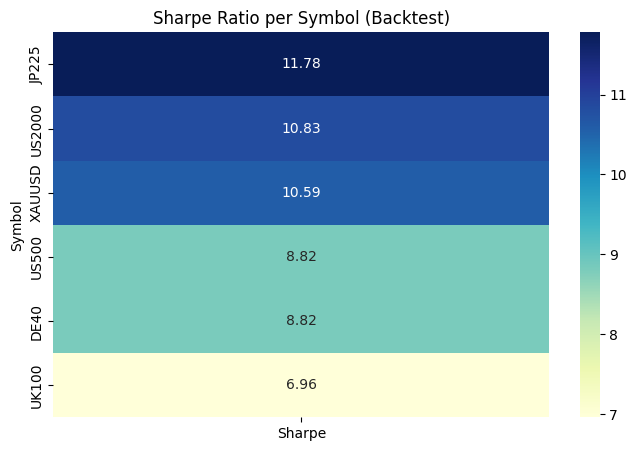

In [ ]:
# ----------------------------------------------------------------------------
# 0) SETUP
# ----------------------------------------------------------------------------
import sys
import os
import warnings
from pathlib import Path

project_root = Path.cwd().parent.parent
sys.path.append(str(project_root))
os.chdir(str(project_root))
warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np
import MetaTrader5 as mt5
import vectorbt as vbt
import joblib
import plotly.graph_objects as go

from data.data_loader_mt5 import get_data_mt5
from features.feature_engineering import add_core_features
from features.labeling_schemes import create_labels_double_barrier

# ----------------------------------------------------------------------------
# 1) CONFIG
# ----------------------------------------------------------------------------
symbols = [
    "US500", "US2000", "UK100", "JP225", "XAUUSD", "DE40", "US30",
    "USTEC", "BTCUSD", "AAPL.NAS", "MSFT.NAS", "GOOG.NAS", "AMZN.NAS", "TSLA.NAS",
    "EURUSD", "GBPUSD", "AUDUSD", "USDJPY", "USDCHF", "GBPJPY", "EURGBP", "CHFJPY", "GBPCHF",
    "ETHUSD", "BNBUSD", "LTCUSD", "XRPUSD", "SOLUSD", "ADAUSD", "DOTUSD", "DOGUSD"
]
timeframe = mt5.TIMEFRAME_H1
n_bars = 5000
start_pos = 0
horizon = 5
threshold = 0.005
model_folder = "models/h1_models"

# Map MT5 timeframe to string format for vectorbt
freq_mapping = {
    mt5.TIMEFRAME_M1: '1min',
    mt5.TIMEFRAME_M5: '5min',
    mt5.TIMEFRAME_M15: '15min',
    mt5.TIMEFRAME_M30: '30min',
    mt5.TIMEFRAME_H1: '1h',
    mt5.TIMEFRAME_H4: '4h',
    mt5.TIMEFRAME_D1: '1D'
}
freq_str = freq_mapping.get(timeframe, '1h')

# ----------------------------------------------------------------------------
# 2) BACKTESTING
# ----------------------------------------------------------------------------
if not mt5.initialize():
    raise RuntimeError("Failed to initialize MT5")

all_results = []

for symbol in symbols:
    print(f"\n\n🔵 Backtesting Symbol: {symbol}")
    model_path = f"{model_folder}/{symbol}_H1_best_model.pkl"
    if not os.path.exists(model_path):
        print(f"⚠️ Model not found for {symbol}, skipping...")
        continue

    loaded = joblib.load(model_path)
    model = loaded["model"]
    scaler = loaded["scaler"]
    features = loaded.get("features", None)

    data = get_data_mt5(symbol=symbol, timeframe=timeframe, n_bars=n_bars, start_pos=start_pos)
    if data is None or len(data) == 0:
        print(f"⚠️ No data for {symbol}, skipping...")
        continue

    df = add_core_features(data)
    df_lbl = create_labels_double_barrier(df, up=threshold, down=threshold, horizon=horizon)

    # Use saved features or fallback
    feature_cols = features if features else df_lbl.columns.intersection(df.columns).tolist()
    feature_df = df_lbl[feature_cols].dropna()
    y = df_lbl.loc[feature_df.index, "barrier_label"]
    close_prices = df_lbl.loc[feature_df.index, "close"]

    X_scaled = scaler.transform(feature_df)
    preds = model.predict(X_scaled) - 1
    acc = (preds == y).mean()

    signals_s = pd.Series(preds, index=close_prices.index)
    pf = vbt.Portfolio.from_signals(
        close=close_prices,
        entries=signals_s > 0,
        exits=signals_s < 0,
        init_cash=10000,
        freq=freq_str,
        fees=0.0002
    )

    total_return = pf.total_return()
    sharpe = pf.sharpe_ratio()
    model_name = type(model).__name__

    all_results.append({
        "Symbol": symbol,
        "Model": model_name,
        "Accuracy": acc,
        "Return(%)": total_return,
        "Sharpe": sharpe
    })

    print("\n✅ Full Backtest Results:")
    print(f"Model={model_name}, Accuracy={acc:.2f}, Return={total_return:.2f}%, Sharpe={sharpe:.2f}")
    print(pf.stats())
    pf.plot(title=f"Backtest: {symbol}").show()

    # Actual vs Predicted Close Plot
    print("\n📈 Plotting Actual vs Predicted Close...")
    actual_close = close_prices.copy()
    predicted_close = actual_close.copy()

    for idx in range(len(predicted_close) - horizon):
        window = preds[idx: idx + horizon]
        predicted_close.iloc[idx + horizon] = predicted_close.iloc[idx] * (1 + 0.001 * window.sum())

    predicted_close = predicted_close.shift(-horizon)

    fig = go.Figure()
    fig.add_trace(go.Scatter(x=actual_close.index, y=actual_close, mode='lines', name='Actual Close'))
    fig.add_trace(go.Scatter(x=predicted_close.index, y=predicted_close, mode='lines', name='Predicted Close'))
    fig.update_layout(
        title=f"📈 Actual vs Predicted Close Price (horizon={horizon}) for {symbol}",
        xaxis_title="Date",
        yaxis_title="Price",
        template="plotly_white",
        height=700
    )
    fig.show()

mt5.shutdown()

# ----------------------------------------------------------------------------
# 3) FINAL SUMMARY + INTERACTIVE TABLE
# ----------------------------------------------------------------------------
summary_df = pd.DataFrame(all_results)
summary_df = summary_df.sort_values(by="Sharpe", ascending=False)

# 1. Heatmap
pivot_df = summary_df.pivot(index="Model", columns="Symbol", values="Sharpe")
pivot_df_rounded = pivot_df.round(1)

fig = go.Figure(data=go.Heatmap(
    z=pivot_df_rounded.values,
    x=pivot_df_rounded.columns,
    y=pivot_df_rounded.index,
    colorscale='RdYlGn',
    colorbar=dict(title='Sharpe'),
    text=pivot_df_rounded.astype(str),
    hovertemplate='Model: %{y}<br>Symbol: %{x}<br>Sharpe: %{z}<extra></extra>',
))

for i, model in enumerate(pivot_df_rounded.index):
    for j, symbol in enumerate(pivot_df_rounded.columns):
        value = pivot_df_rounded.iloc[i, j]
        if pd.notnull(value):
            fig.add_annotation(
                x=symbol, y=model,
                text=f"{value:.2f}",
                showarrow=False,
                font=dict(color="black", size=11)
            )

fig.update_layout(
    title="Sharpe Ratio per Model per Symbol (Backtest)",
    xaxis_title="Symbol", yaxis_title="Model",
    width=1300, height=600
)
fig.show()

# 2. Interactive Summary Table
serializable_cols = ["Symbol", "Model", "Accuracy", "Return(%)", "Sharpe"]
table_df = summary_df[serializable_cols].copy()
table_df["Sharpe"] = table_df["Sharpe"].round(2)
table_df["Accuracy"] = table_df["Accuracy"].round(3)
table_df["Return(%)"] = table_df["Return(%)"].round(2)

fig2 = go.Figure(
    data=[go.Table(
        header=dict(values=list(table_df.columns), fill_color='paleturquoise', align='left'),
        cells=dict(values=[table_df[c] for c in table_df.columns], fill_color='lavender', align='left')
    )]
)
fig2.update_layout(title="Backtest Performance Summary")
fig2.show()

# 3. Optional Export
try:
    from IPython.display import display, FileLink
    table_df.to_csv("backtest_summary.csv", index=False)
    display(FileLink("backtest_summary.csv"))
except ImportError:
    pass


## Part 3: Model Training & Hyperparameter Tuning

**Objective:**  
Train an ML model (e.g., RandomForest, XGBoost) on the engineered features to predict the chosen labels.

**Tasks:**
- Perform time-based or walk-forward splits  
- Select top features if desired (e.g., using RandomForest feature importance)  
- Use `RandomizedSearchCV` or `GridSearchCV` to find optimal hyperparameters  
- Save the best model pipeline (e.g., `best_rf_pipeline.pkl`) 

Optuna compared to default with core feautures

In [ ]:
# ----------------------------------------------------------------------------
# FINAL PRO VERSION: Multi-Symbol Model Optimization with Optuna + TimeSeriesSplit
# ----------------------------------------------------------------------------

import sys
import os
import warnings
from pathlib import Path

# ---------------------------------------------------------------------------
# 0) SETUP
# ---------------------------------------------------------------------------
project_root = Path.cwd().parent.parent
sys.path.append(str(project_root))
os.chdir(str(project_root))
warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np
import MetaTrader5 as mt5
import joblib
import optuna

from data.data_loader_mt5 import get_data_mt5
from features.feature_engineering import add_core_features
from features.labeling_schemes import create_labels_multi_bar
from sklearn.model_selection import TimeSeriesSplit
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score

# ----------------------------------------------------------------------------
# 1) CONFIGURATION
# ----------------------------------------------------------------------------
symbols = [
    "US500", "US2000", "UK100", "JP225", "XAUUSD", "DE40", "US30",
    "USTEC",  "BTCUSD", "AAPL.NAS", "MSFT.NAS", "GOOG.NAS", "AMZN.NAS", "TSLA.NAS"
]
timeframe = mt5.TIMEFRAME_H1
n_bars = 10000
start_pos = 5000
horizon = 5
threshold = 0.005
folds = 3
trials = 50

save_folder = "models/rf_models"
os.makedirs(save_folder, exist_ok=True)

summary_rows = []

from sklearn.base import clone

# ----------------------------------------------------------------------------
# 2) START MULTI-SYMBOL OPTIMIZATION + BASELINE COMPARISON
# ----------------------------------------------------------------------------
print("\n⚡ Starting MT5 connection...")
if not mt5.initialize():
    raise RuntimeError("❌ Failed to initialize MT5")

for symbol in symbols:
    print(f"\n\n🔵 Optimizing Symbol: {symbol}")

    # Fetch Data
    data = get_data_mt5(symbol=symbol, timeframe=timeframe, n_bars=n_bars, start_pos=start_pos)
    if data is None or len(data) < 1000:
        print(f"⚠️ Not enough data for {symbol}, skipping...")
        continue

    df = df = add_core_features(data)
    df_lbl = create_labels_multi_bar(df, horizon=horizon, threshold=threshold)

    X = df_lbl.drop(columns=["multi_bar_label", "future_return_h"])
    y = df_lbl["multi_bar_label"]

    tscv = TimeSeriesSplit(n_splits=folds)

    # -- (A) Evaluate DEFAULT RandomForest (baseline) --
    default_params = {
        "n_estimators": 100,
        "max_depth": None,
        "min_samples_split": 2,
        "max_features": "sqrt",
        "random_state": 42
    }
    baseline_model = Pipeline([
        ("scaler", StandardScaler()),
        ("rf", RandomForestClassifier(**default_params))
    ])
    baseline_scores = []
    for train_idx, test_idx in tscv.split(X):
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
        baseline_model.fit(X_train, y_train + 1)
        preds = baseline_model.predict(X_test)
        baseline_scores.append(accuracy_score(y_test + 1, preds))
    baseline_acc = np.mean(baseline_scores)

    # -- (B) OPTUNA HPO --
    def objective(trial):
        params = {
            "n_estimators": trial.suggest_int("n_estimators", 100, 1000, step=100),
            "max_depth": trial.suggest_int("max_depth", 5, 30),
            "min_samples_split": trial.suggest_int("min_samples_split", 2, 20),
            "max_features": trial.suggest_categorical("max_features", ["sqrt", "log2", 0.5, 0.8, None])
        }
        model = Pipeline([
            ("scaler", StandardScaler()),
            ("rf", RandomForestClassifier(**params, random_state=42))
        ])
        scores = []
        for train_idx, test_idx in tscv.split(X):
            X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
            y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
            model.fit(X_train, y_train + 1)
            preds = model.predict(X_test)
            scores.append(accuracy_score(y_test + 1, preds))
        return np.mean(scores)

    study = optuna.create_study(direction="maximize")
    study.optimize(objective, n_trials=trials)
    best_params = study.best_params
    best_acc = study.best_value

    print(f"✅ Default RF Accuracy: {baseline_acc:.4f}")
    print(f"✅ Best Optuna RF Accuracy: {best_acc:.4f} | Params: {best_params}")

    # Retrain best Optuna model on ALL DATA for final save
    best_model = Pipeline([
        ("scaler", StandardScaler()),
        ("rf", RandomForestClassifier(
            n_estimators=best_params["n_estimators"],
            max_depth=best_params["max_depth"],
            min_samples_split=best_params["min_samples_split"],
            max_features=best_params["max_features"],
            random_state=42
        ))
    ])
    best_model.fit(X, y + 1)

    model_path = os.path.join(save_folder, f"{symbol}_best_model.pkl")
    joblib.dump(best_model, model_path)
    print(f"💾 Saved best model for {symbol} to {model_path}")

    summary_rows.append({
        "Symbol": symbol,
        "DefaultRF_Acc": baseline_acc,
        "OptunaRF_Acc": best_acc,
        "BestParams": best_params
    })

mt5.shutdown()
print("\n✅ All symbols optimized and compared. MT5 connection closed.")

# ----------------------------------------------------------------------------
# 3) SAVE SUMMARY TABLE
# ----------------------------------------------------------------------------
summary_df = pd.DataFrame(summary_rows)
summary_path = os.path.join(save_folder, "summary_results.csv")
summary_df.to_csv(summary_path, index=False)

print(f"\n📄 Saved optimization summary to {summary_path}")
print(summary_df)



⚡ Starting MT5 connection...


🔵 Optimizing Symbol: US500


[I 2025-05-26 10:31:11,169] A new study created in memory with name: no-name-6774e8c0-93bd-40da-8e7c-4e28d4787b9f
[I 2025-05-26 10:36:58,448] Trial 0 finished with value: 0.6625300240192153 and parameters: {'n_estimators': 300, 'max_depth': 23, 'min_samples_split': 10, 'max_features': 0.5}. Best is trial 0 with value: 0.6625300240192153.
[I 2025-05-26 10:48:42,476] Trial 1 finished with value: 0.6994929276754737 and parameters: {'n_estimators': 500, 'max_depth': 16, 'min_samples_split': 10, 'max_features': 0.8}. Best is trial 1 with value: 0.6994929276754737.
[I 2025-05-26 10:49:16,077] Trial 2 finished with value: 0.5864691753402721 and parameters: {'n_estimators': 200, 'max_depth': 28, 'min_samples_split': 20, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.6994929276754737.
[I 2025-05-26 10:51:25,168] Trial 3 finished with value: 0.6527888977848946 and parameters: {'n_estimators': 900, 'max_depth': 12, 'min_samples_split': 5, 'max_features': 'sqrt'}. Best is trial 1 with valu

✅ Default RF Accuracy: 0.6641
✅ Best Optuna RF Accuracy: 0.8779 | Params: {'n_estimators': 900, 'max_depth': 5, 'min_samples_split': 13, 'max_features': None}
💾 Saved best model for US500 to models/rf_models\US500_best_model.pkl


🔵 Optimizing Symbol: US2000


[I 2025-05-26 20:30:25,467] A new study created in memory with name: no-name-ff7cad38-03cb-41a0-a324-287aa388cdf5
[I 2025-05-26 20:47:21,805] Trial 0 finished with value: 0.6585268214571657 and parameters: {'n_estimators': 700, 'max_depth': 24, 'min_samples_split': 12, 'max_features': 0.8}. Best is trial 0 with value: 0.6585268214571657.
[I 2025-05-26 20:55:54,522] Trial 1 finished with value: 0.6774753135842007 and parameters: {'n_estimators': 600, 'max_depth': 26, 'min_samples_split': 19, 'max_features': 0.5}. Best is trial 1 with value: 0.6774753135842007.
[I 2025-05-26 21:12:38,545] Trial 2 finished with value: 0.7135041366426474 and parameters: {'n_estimators': 900, 'max_depth': 8, 'min_samples_split': 4, 'max_features': None}. Best is trial 2 with value: 0.7135041366426474.
[I 2025-05-26 21:13:18,480] Trial 3 finished with value: 0.7522017614091273 and parameters: {'n_estimators': 800, 'max_depth': 5, 'min_samples_split': 11, 'max_features': 'log2'}. Best is trial 3 with value: 0